## **Advanced Classification using Machine Learning in HealthCare**

## Abstract

This lab is dedicated to application of an advanced analysis of Big Data to the spread of COVID-19 in the world. We will study how to make image recognition of a chest X-ray to provide a diagnosis forecast.

## Introduction

X-rays are widely used in medical practice. They can be used to identify various diseases. However, a diagnosis depends on a doctor's experience, which can lead to improper treatment. Modern methods of artificial intelligence and pattern recognition make it possible to create expert systems that allow you to establish a diagnosis automatically.

This lab will show you how to upload images, transform them, and determine the basic features that underlie diseases classification.

Two different approaches to the classification of images (diseases) will be shown:
1. Different classical methods and their comparison 
2. Convolutional Neural Networks.

## Materials and methods

In this lab, we will learn the basic methods of images classifications. The laboratory consists of four stages:
* Download and preliminary transformation of images
* Creating image features
* Comparing different classical classification methods
* Building and fitting Convolutional Neural Network


The statistical data was obtained from https://www.kaggle.com/pranavraikokte/covid19-image-dataset under [CC BY-SA 4.0](https://creativecommons.org/licenses/by-sa/4.0/) license.


## Prerequisites
* [Python](https://www.python.org)
* [os](https://docs.python.org/3/library/os.html)
* [numpy](https://numpy.org)
* [glob](https://docs.python.org/3/library/glob.html)
* [SeaBorn](https://seaborn.pydata.org)
* [Matplotlib](https://matplotlib.org)
* [mahotas](https://mahotas.readthedocs.io/en/latest/)
* [keras](https://keras.io)
* [scikit-learn](https://scikit-learn.org)
* [pandas](https://pandas.pydata.org)

## Objectives
After completing this lab, you will be able to:

* Download and transform images.
* Create features of images.
* Build different classification models.
* Build CNN models.
* Build a diagnosis based on X-ray photos.

# Download and preliminary transformation of images

## Required libraries installation
We need to install additional libraries and upgrade existing ones in the lab.





In [1]:
!pip install mahotas

In [2]:
!pip install seaborn

## Required libraries import

Here we are going to use Mahotas for image processing and Keras library for creating our CNN model and its training. We will also use Matplotlib and Seaborn for visualizing our dataset to gain a better understanding of the images we are going to handle.
We will also use libraries os and glob to work with files and folders. NumPy will be applied for arrays of images. Scikit-Learn will be used for classical classification models. And we will take Pandas for present comparison of classifiers.


In [8]:
!pip install seaborn

In [6]:
from matplotlib import pyplot as plt

In [10]:
import mahotas as mh
#import seaborn as sns
#from matplotlib import pyplot as plt 
from glob import glob
import os
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler 

#Classifiers
from sklearn.linear_model import LogisticRegression 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import ConfusionMatrixDisplay

## Data loading

In [11]:
!pip install skillsnetwork

In [5]:
import skillsnetwork

await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/data-science-in-health-care-advanced-machine-learning-classification/LargeData/Covid19-dataset.zip",
    path="Covid19-dataset",
    overwrite=True
)

await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/data-science-in-health-care-advanced-machine-learning-classification/NN.zip",
    path="NN",
    overwrite=True
)


  0%|          | 0/672 [00:00<?, ?it/s]

Saved to 'Covid19-dataset'


  0%|          | 0/4 [00:00<?, ?it/s]

Saved to 'NN'


Images have to be of the same size for classification. In order to achieve this, let's create a global variable that will determine the size (height and width) for image resizing. Both are 224 in our case.


In [12]:
IMM_SIZE = 224

For convenience, we create a function that downloads and displays all the pictures from a specified directory.
In order to classify images, all pictures should be placed in subdirectories. The names of these subdirectories are actually class names.
In our case, the images are X-rays which should be placed into subfolders with the names of diagnoses.
For example, a COVID subfolder is to contain X-rays of people with this disease.
First of all, we should create a list of subfolders, which is a list of possible disease classes. In our case, it will be: Normal, COVID, Viral Pneumonia.

Next, we need to create a list of all images.
After that, let's download and preprocess all the images:
1. Download by [mahotas.imread()](https://mahotas.readthedocs.io/en/latest/io.html)
2. It is necessary to resize the images to (IMM_SIZE x IMM_SIZE). If an image is gray-colored it is presented as a 2D matrix: (high, width). jpg and png images are 3D (high, width, 3 or 4). To do this, we should use: [mahotas.resize_to()](https://github.com/luispedro/mahotas/blob/master/mahotas/resize.py)
3. If the third parameter of an image shape equals 4, it means alpha channel. We can remove it using slice image[:,:,:3].
4. Then we need to transform all the images to gray 2D format by: [mahotas.colors.rgb2grey()](https://mahotas.readthedocs.io/en/latest/color.html)

The function returns an array of tuples [image, class name].


In [13]:
def get_data(folder):
    
    class_names = [f for f in os.listdir(folder) if not f.startswith('.')] # ctreate a list of SubFolders
    data = []
    # class_names = ['Covid', 'Normal', 'Viral Pneumonia']
    print(class_names)
    for t, f in enumerate(class_names):
        images = glob(folder + "/" + f + "/*") # create a list of files
        print("Downloading: ", f)
        fig = plt.figure(figsize = (50,50)) 
        for im_n, im in enumerate(images):
            plt.gray() # set grey colormap of images
            image = mh.imread(im)
            if len(image.shape) > 2:
                image = mh.resize_to(image, [IMM_SIZE, IMM_SIZE, image.shape[2]]) # resize of RGB and png images
            else:
                image = mh.resize_to(image, [IMM_SIZE, IMM_SIZE]) # resize of grey images    
            if len(image.shape) > 2:
                image = mh.colors.rgb2grey(image[:,:,:3], dtype = np.uint8)  # change of colormap of images alpha chanel delete
            plt.subplot(int(len(images)/5)+1,5,im_n+1) # create a table of images
            plt.imshow(image)
            data.append([image, f])
        plt.show()

    return np.array(data, dtype=object)   

For training and testing, all the pictures should be divided into training and test groups and located in separate folders. Let's upload all the images to the corresponding arrays.


['Viral Pneumonia', 'Normal', 'Covid']
Downloading:  Viral Pneumonia


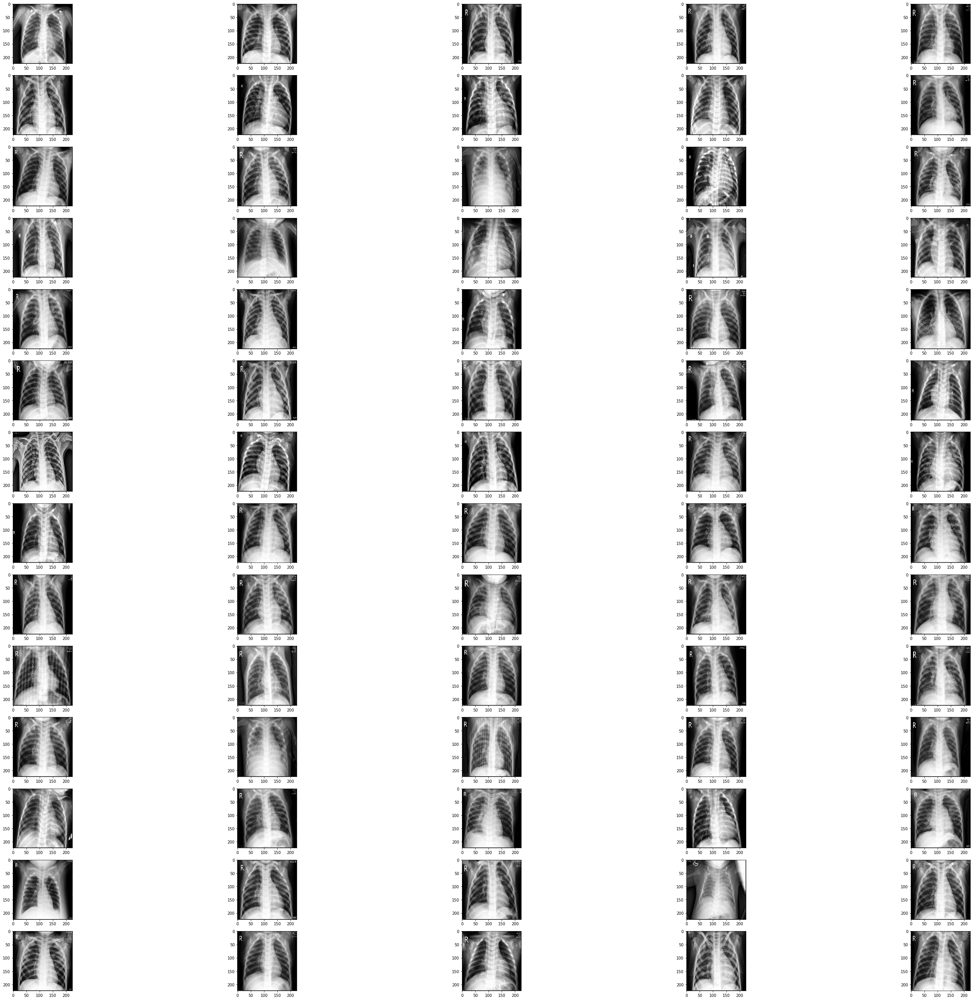

Downloading:  Normal


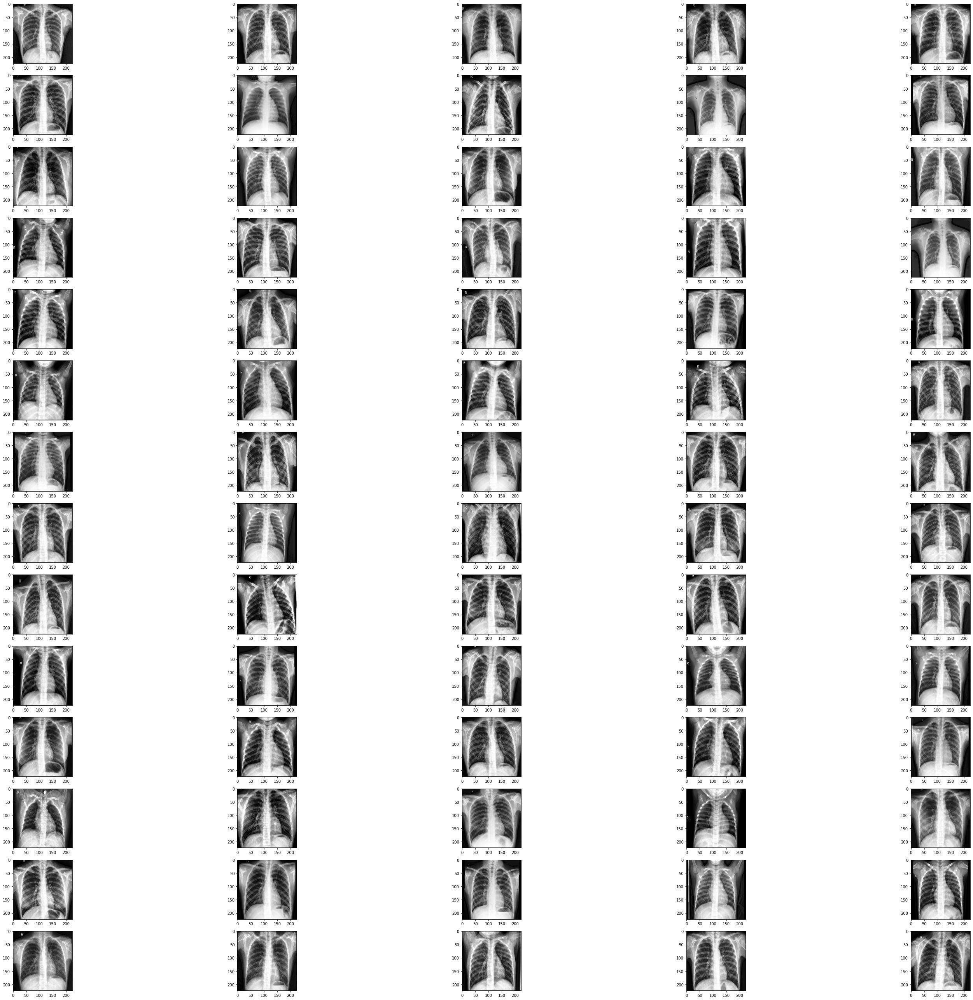

Downloading:  Covid


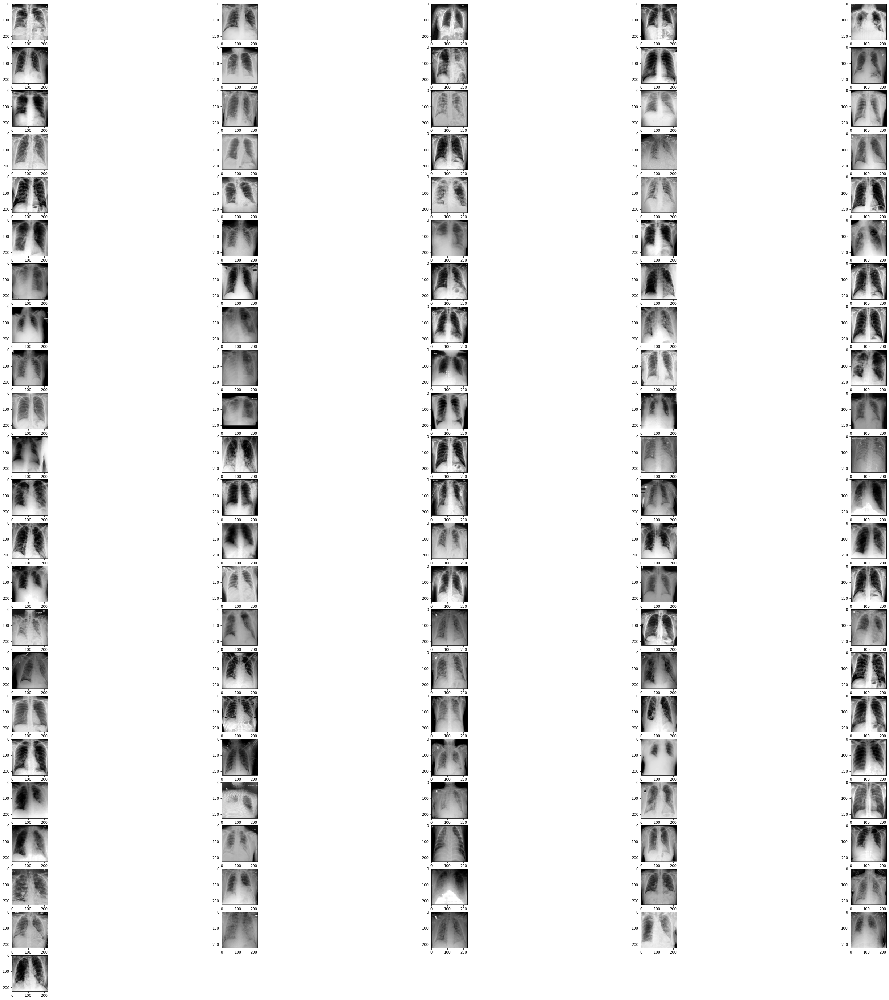

['Viral Pneumonia', 'Normal', 'Covid']
Downloading:  Viral Pneumonia


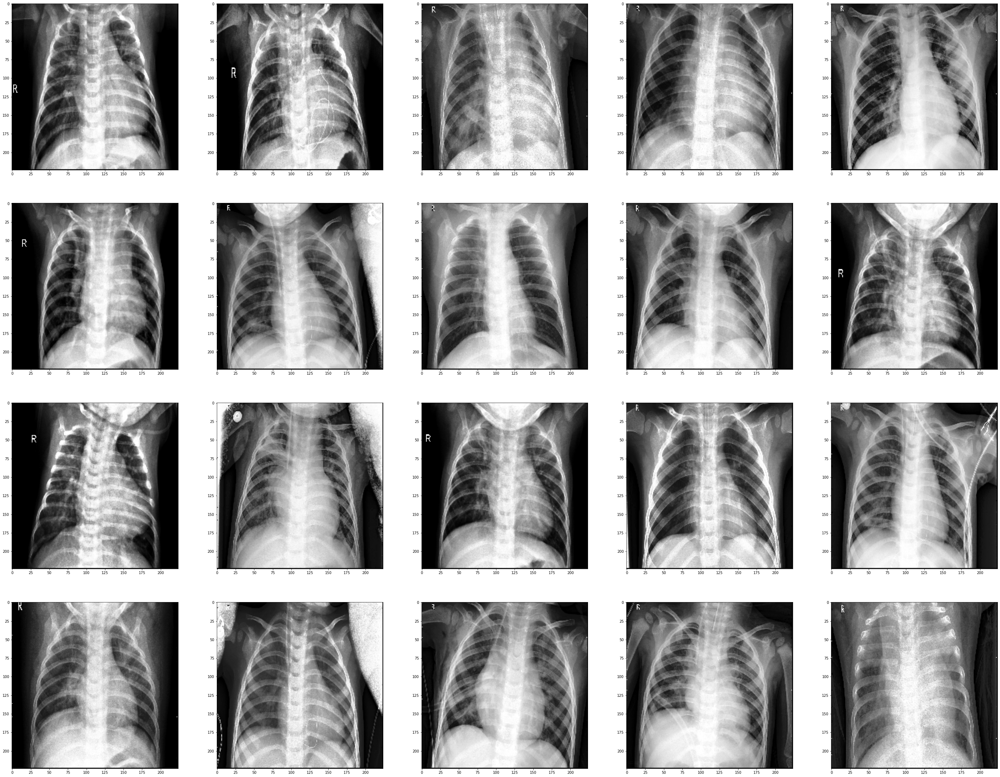

Downloading:  Normal


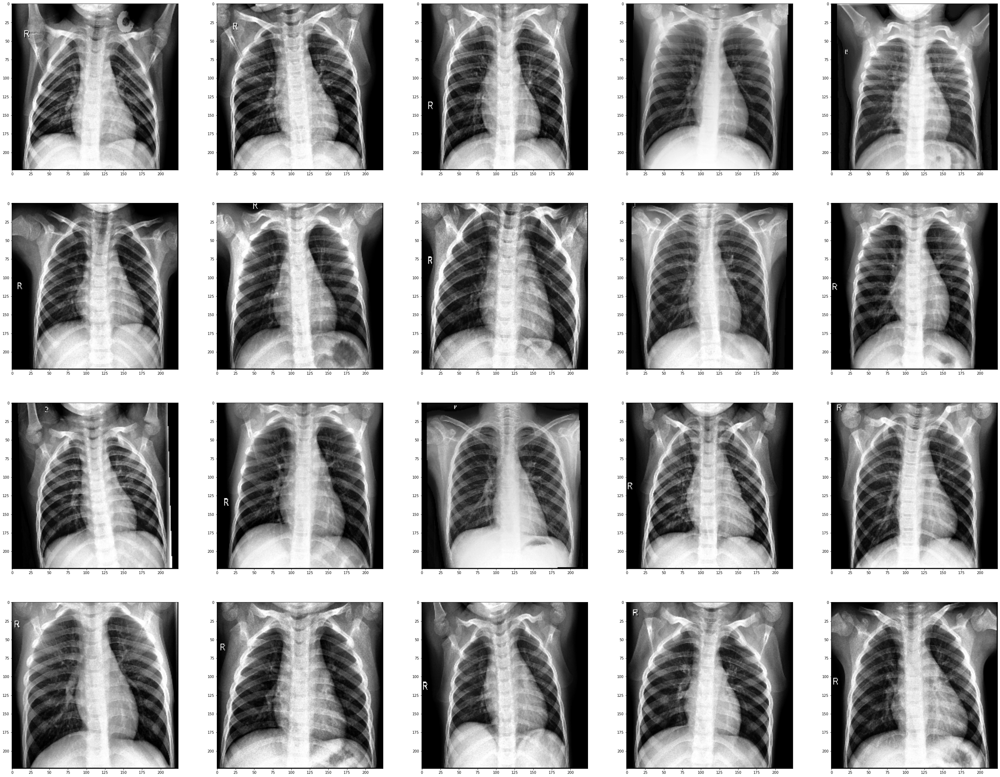

Downloading:  Covid


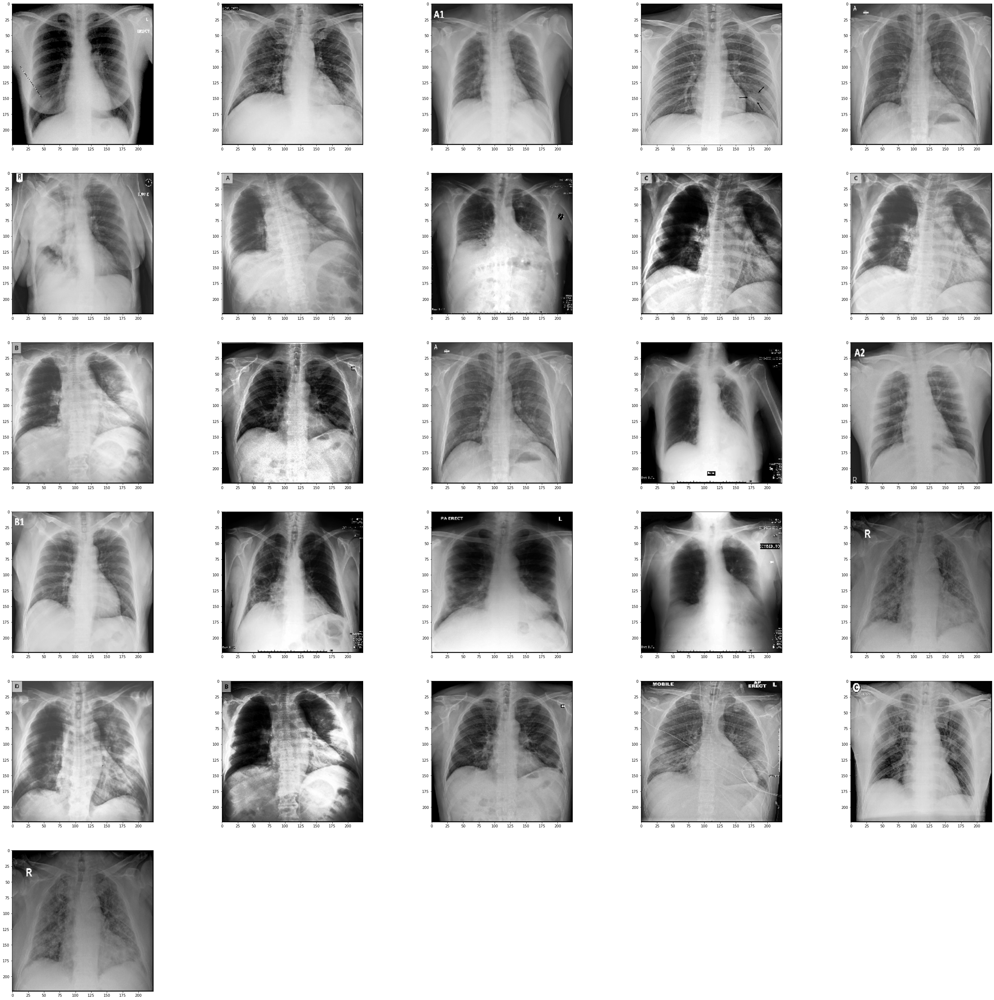

In [14]:
d = "Covid19-dataset/Covid19-dataset/train"
train = get_data(d)

d = "Covid19-dataset/Covid19-dataset/test"
val = get_data(d)

In [15]:
print("Train shape", train.shape) # Size of the training DataSet
print("Test shape", val.shape) # Size of the test DataSet
print("Image size", train[0][0].shape) # Size of image

Train shape (251, 2)
Test shape (66, 2)
Image size (224, 224)


As you can see, the training DataSet consists of 251 images and the test one consists of 66 images. All the images are in grey 2D (224x224) format.


## Data visualization

Let’s visualize our data and see what exactly we are working with. We use Seaborn to plot the number of images in all the classes. You can see what the output looks like.


In [16]:
%config InlineBackend.figure_formats = ['svg']
import matplotlib.pyplot as plt
import matplotlib
matplotlib.pyplot.rc('text', usetex=True)

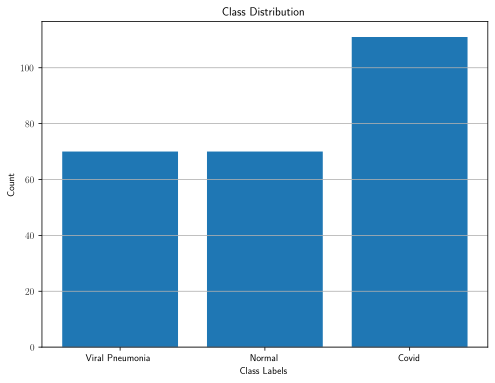

In [17]:
import matplotlib.pyplot as plt
from collections import Counter

# Get label counts
label_counts = Counter([i[1] for i in train])

# Extract labels and counts
labels = list(label_counts.keys())
counts = list(label_counts.values())

# Plot using matplotlib
plt.figure(figsize=(8, 6))
plt.bar(labels, counts)
plt.xlabel('Class Labels')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.grid(True, axis='y')
plt.show()


Let us also visualize the first image from the Viral Pneumonia and Covid classes in the training DataSet:


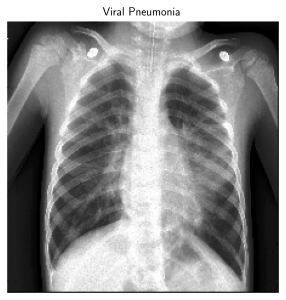

In [21]:
# plt.figure(figsize = (5,5))
# plt.imshow(train[np.where(train[:,1] == 'Viral Pneumonia')[0][0]][0])
# plt.title('Viral Pneumonia')

plt.figure(figsize=(5, 5))

# Find the first image with label 'Viral Pneumonia'
for img, label in train:
    if label == 'Viral Pneumonia':
        plt.imshow(img, cmap='gray')  # Add cmap if image is grayscale
        plt.title('Viral Pneumonia')
        plt.axis('off')
        break

plt.show()


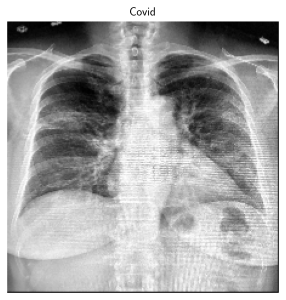

In [23]:
# plt.figure(figsize = (5,5))
# plt.imshow(train[np.where(train[:,1] == 'Covid')[0][0]][0])
# plt.title('Covid')

plt.figure(figsize=(5, 5))

# Loop through to find the first 'Covid' image
for img, label in train:
    if label == 'Covid':
        plt.imshow(img, cmap='gray')  # Remove cmap='gray' if image is in color
        plt.title('Covid')
        plt.axis('off')
        break

plt.show()



## Image features creation

To classify objects, you need to transform the data set so that the input is a set of features and the output is an object class. An image is a matrix of pixels. Each pixel is a color. Therefore, it is impossible to submit a bare picture into a classical classifier's input. It is necessary to turn each picture into a set of certain features.

Mahotas makes it easy to calculate features of an image.
The corresponding functions are found in the [mahotas.features](https://mahotas.readthedocs.io/en/latest/) submodule. The Haralick set of texture features is well known. Like many image processing algorithms, it is named for its inventor. The features are based on textures, that is, they distinguish between structured and unstructured images, as well as various repetitive structures. With the help of Mahotas, these features are calculated very easily:
haralick_features = mh.features.haralick (image)
haralick_features_mean = np.mean (haralick_features, axis = O)
haralick_features_all = np.ravel (haralick_features)
The mh.features.haralick function returns a 4 x 13 array wiсh should be transformad into 1D by [NumPy.ravel()](https://numpy.org/doc/stable/reference/generated/numpy.ravel.html). The first dimension is the four possible directions in which the features are calculated (vertical, horizontal, and two diagonals). If we are not interested in any particular direction, then we can average the features in all directions (in the code above, this variable is called haralick_features_mean). Alternatively, you can use all the characteristics individually (variable haralick_features_all). The choice depends on the properties of a particular dataset. We decided that the vertical and horizontal features should be stored separately in our case, so we use haralick_features_all.


We should make a function for the DataSet features creation.



In [24]:
def create_features(data):
    features = []
    labels = []
    for image, label in data:
        features.append(mh.features.haralick(image).ravel())
        labels.append(label)
    features = np.array(features)
    labels = np.array(labels)
    return (features, labels) 

features_train, labels_train = create_features(train)
features_test, labels_test = create_features(val)

# Comparing different classical classification methods

If we want to compare some classificators, we should use a Pipeline.
A pipeline helps to chain multiple estimators into a single one. This is useful as there is often a fixed number of steps in data processing, for example, feature selection, normalization and classification. A pipeline serves multiple purposes here:

You only have to call fit() once to evaluate a whole sequence of estimators.

You can grid search over parameters of all estimators in the pipeline at once.

Pipelines help to avoid leaking statistics from your test data into the trained model in cross-validation by ensuring that the same samples are used to train the transformers and predictors.
All estimators in a pipeline, except the last one, should be transformers (i.e. should have a transform method). The last estimator may be of any type (transformer, classifier, etc.).

The [sklearn.pipeline](https://scikit-learn.org/stable/modules/classes.html?highlight=pipeline#module-sklearn.pipeline) module implements utilities to build a composite estimator, as a chain of transforms and estimators.

In order to test how it works, we will use LogisticRegression.


Training DataSet accuracy:  89.6% Test DataSet accuracy:  84.8%


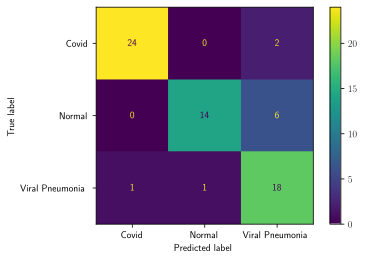

In [25]:
clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression())])
clf.fit(features_train, labels_train)
scores_train = clf.score(features_train, labels_train)
scores_test = clf.score(features_test, labels_test)
print('Training DataSet accuracy: {: .1%}'.format(scores_train), 'Test DataSet accuracy: {: .1%}'.format(scores_test))
ConfusionMatrixDisplay.from_estimator(clf, features_test, labels_test)
plt.show() 

As you can see, the results are not bad.
Conflusion matrix shows us how many mistaken predictions we got.
It allows us to check other classifiers and compare the results.
We will test:
* [Logistic Regression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html?highlight=logistic%20regression#sklearn.linear_model.LogisticRegression)
* [Nearest Neighbors](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html?highlight=nearest%20neighbors#sklearn.neighbors.NearestNeighbors)
* [Linear SVM](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVR.html?highlight=linear%20svm#sklearn.svm.LinearSVR)
* [RBF SVM](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.kernels.RBF.html?highlight=rbf#sklearn.gaussian_process.kernels.RBF)
* [Gaussian Process](https://scikit-learn.org/stable/modules/generated/sklearn.gaussian_process.GaussianProcessClassifier.html?highlight=gaussianprocessclassifier#sklearn.gaussian_process.GaussianProcessClassifier)
* [Decision Tree](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html?highlight=decisiontreeclassifier#sklearn.tree.DecisionTreeClassifier)
* [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html?highlight=randomforestclassifier#sklearn.ensemble.RandomForestClassifier)
* [Multi-layer Perceptron classifier](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html?highlight=mlpclassifier#sklearn.neural_network.MLPClassifier)
* [Ada Boost](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html?highlight=adaboostclassifier#sklearn.ensemble.AdaBoostClassifier)
* [Naive Bayes](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html?highlight=gaussiannb#sklearn.naive_bayes.GaussianNB)
* [Quadratic Discriminant Analysis](https://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis.html?highlight=quadraticdiscriminantanalysis#sklearn.discriminant_analysis.QuadraticDiscriminantAnalysis)


In [26]:
names = ["Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    LogisticRegression(),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(reg_param=0.1)]
scores_train = []
scores_test = []
for name, clf in zip(names, classifiers):
    print("Fitting:", name)
    clf = Pipeline([('preproc', StandardScaler()), ('classifier', clf)])
    clf.fit(features_train, labels_train)
    score_train = clf.score(features_train, labels_train)
    score_test = clf.score(features_test, labels_test)
    scores_train.append(score_train)
    scores_test.append(score_test)

Fitting: Logistic Regression
Fitting: Nearest Neighbors
Fitting: Linear SVM
Fitting: RBF SVM
Fitting: Gaussian Process
Fitting: Decision Tree
Fitting: Random Forest
Fitting: Neural Net
Fitting: AdaBoost
Fitting: Naive Bayes
Fitting: QDA


Let's print the results as a table.


In [27]:
res = pd.DataFrame(index = names)
res['scores_train'] = scores_train
res['scores_test'] = scores_test
res.columns = ['Test','Train']
res.index.name = "Classifier accuracy"
pd.options.display.float_format = '{:,.2f}'.format
print(res)

                     Test  Train
Classifier accuracy             
Logistic Regression  0.90   0.85
Nearest Neighbors    0.87   0.70
Linear SVM           0.79   0.71
RBF SVM              1.00   0.48
Gaussian Process     0.79   0.67
Decision Tree        0.90   0.64
Random Forest        0.84   0.58
Neural Net           0.93   0.82
AdaBoost             0.87   0.55
Naive Bayes          0.67   0.59
QDA                  0.78   0.80


You can see that the calculations are very fast and that Logistic Regression and Neural Network show the best result for the test DataSet.

Let's compare the results on a plot.


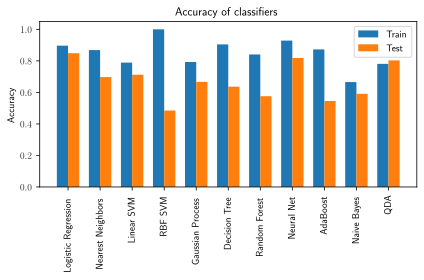

In [28]:
x = np.arange(len(names))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, scores_train, width, label='Train')
rects2 = ax.bar(x + width/2, scores_test, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of classifiers')
ax.set_xticks(x)
plt.xticks(rotation = 90)
ax.set_xticklabels(names)
ax.legend()

fig.tight_layout()

plt.show()